# Importando bibliotecas

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [3]:
#chamando funcao
import functions as aux

# Verificando estrutura do data frame

In [4]:
carteira_teorica = 'python_verificar_dados_benchmark'
url = f'../result/{carteira_teorica}.csv'

In [5]:
df = pd.read_csv(url, index_col=0)

In [6]:
df

,ibov,sp500,dow_jones,nasdaq,russel_200,ty_10y,eur_usd,gold,silver,crude_oil,bitcoin,gbp_usd
date,,,,,,,,,,,,
1927-12-30,NaN,17.660000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1928-01-03,NaN,17.760000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1928-01-04,NaN,17.719999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1928-01-05,NaN,17.549999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1928-01-06,NaN,17.660000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-10,105481.0,3900.860107,31392.789063,11340.019531,1800.280029,3.156,1.061921,1871.5,21.913,120.669998,29083.804688,1.249297
2022-06-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28360.810547,NaN
2022-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26762.648438,NaN


In [7]:
#convertendo index para data
df.index = pd.to_datetime(df.index, format='%Y-%m-%d', errors='ignore')

In [8]:
df.index

DatetimeIndex(['1927-12-30', '1928-01-03', '1928-01-04', '1928-01-05',
               '1928-01-06', '1928-01-09', '1928-01-10', '1928-01-11',
               '1928-01-12', '1928-01-13',
               ...
               '2022-06-05', '2022-06-06', '2022-06-07', '2022-06-08',
               '2022-06-09', '2022-06-10', '2022-06-11', '2022-06-12',
               '2022-06-13', '2022-06-14'],
              dtype='datetime64[ns]', name='date', length=27838, freq=None)

In [9]:
df_mod = df.copy()

# Configurando variáveis para tratar os dados

## Abaixo temos a estrutura do data frame com a quantidade de registro

In [10]:
#coluna x linha
df_mod.shape

(27838, 12)

In [11]:
#numero de registros
df_mod.shape[0]

27838

## Iremos considerar 15% dos registros

In [12]:
PORCENTAGEM_ACEITAVEL = 15
THRESH_NUMBER = df_mod.shape[0]*(PORCENTAGEM_ACEITAVEL/100)
THRESH_NUMBER

4175.7

## Plotando gráfico para verificar os dados faltantes

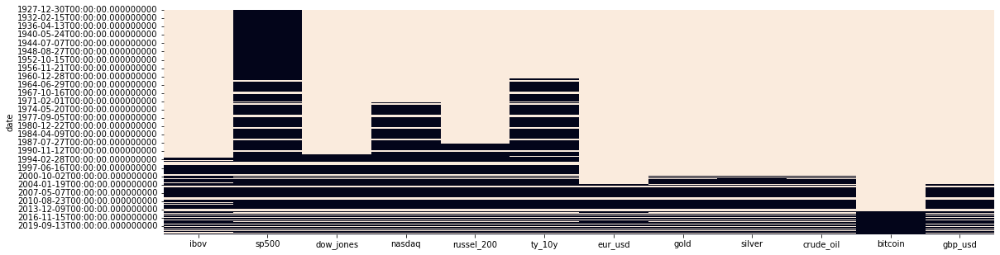

In [14]:
plt.figure(figsize=(18,5))
sns.heatmap(df_mod.isnull(), cbar=False);

In [15]:
df_aux = df.copy()

# Tratando os dados para manter apenas a quantidade em % dos registros

In [16]:
df_aux.dropna(axis=1, thresh=THRESH_NUMBER, inplace=True)
df_aux.dropna(inplace=True)

In [17]:
df_aux.shape

(4420, 11)

## Plotando gráfico para verificar os dados faltantes (após tratamento dos dados)

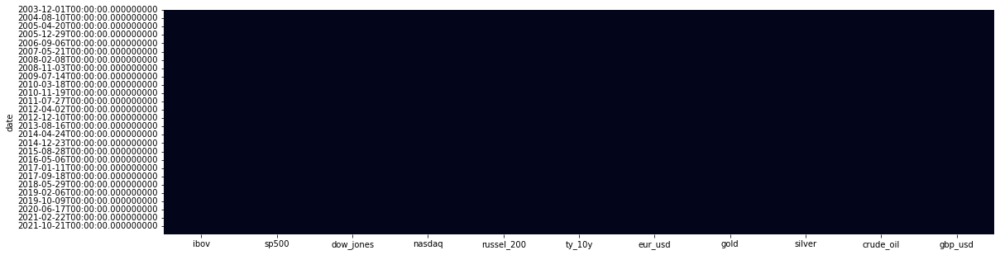

In [18]:
plt.figure(figsize=(18,5))
sns.heatmap(df_aux.isnull(), cbar=False);

In [19]:
df_aux.tail()

,ibov,sp500,dow_jones,nasdaq,russel_200,ty_10y,eur_usd,gold,silver,crude_oil,gbp_usd
date,,,,,,,,,,,
2022-06-07,110070.0,4160.680176,33180.140625,12175.230469,1919.560059,2.972,1.069141,1847.500000,22.159000,119.410004,1.252348
2022-06-08,108368.0,4115.770020,32910.898438,12086.269531,1891.010010,3.029,1.069862,1851.900024,22.073999,122.110001,1.258732
2022-06-09,107094.0,4017.820068,32272.789063,11754.230469,1850.859985,3.044,1.071765,1848.800049,21.797001,121.510002,1.254029
2022-06-10,105481.0,3900.860107,31392.789063,11340.019531,1800.280029,3.156,1.061921,1871.500000,21.913000,120.669998,1.249297
2022-06-13,102598.0,3749.629883,30516.740234,10809.230469,1714.589966,3.366,1.048999,1828.000000,21.236000,120.930000,1.227491


## Verificando outliers

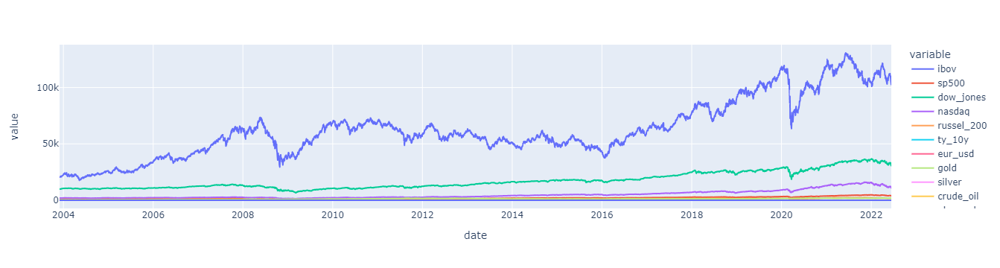

In [20]:
#verificando outliers
px.line(df_aux)

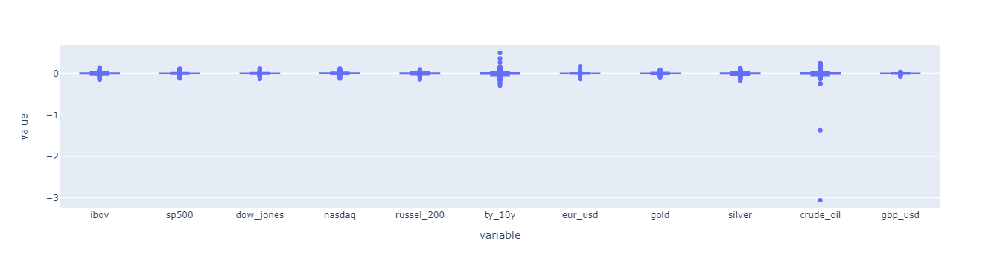

In [21]:
px.box(data_frame=df_aux.pct_change().dropna())

## Verificando dados que tenham valores consecutivos

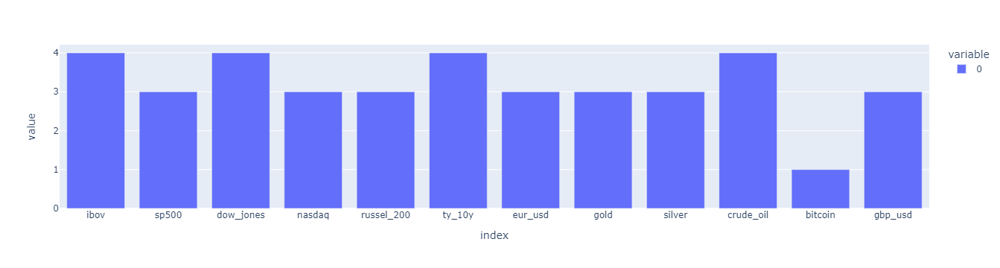

In [24]:
df_consecutivos = aux.pfun_precos_iguais_consecutivos(df_mod)
px.bar(df_consecutivos)

## Removendo os dados que tenham valores consecutivos acima de 10x

In [25]:
OUT_NUMBER = 10
df_outliers = df_consecutivos[df_consecutivos > OUT_NUMBER].index.to_list()

In [26]:
df_outliers

[]

In [27]:
df_aux.drop(df_outliers, axis=1, inplace=True)
df_aux.shape

(4420, 11)

In [28]:
#verificando os ultimos registros do df
df_aux.tail()

,ibov,sp500,dow_jones,nasdaq,russel_200,ty_10y,eur_usd,gold,silver,crude_oil,gbp_usd
date,,,,,,,,,,,
2022-06-07,110070.0,4160.680176,33180.140625,12175.230469,1919.560059,2.972,1.069141,1847.500000,22.159000,119.410004,1.252348
2022-06-08,108368.0,4115.770020,32910.898438,12086.269531,1891.010010,3.029,1.069862,1851.900024,22.073999,122.110001,1.258732
2022-06-09,107094.0,4017.820068,32272.789063,11754.230469,1850.859985,3.044,1.071765,1848.800049,21.797001,121.510002,1.254029
2022-06-10,105481.0,3900.860107,31392.789063,11340.019531,1800.280029,3.156,1.061921,1871.500000,21.913000,120.669998,1.249297
2022-06-13,102598.0,3749.629883,30516.740234,10809.230469,1714.589966,3.366,1.048999,1828.000000,21.236000,120.930000,1.227491


## Tratando outliers manualmente

### No exemplo abaixo nenhum registro será removido

In [29]:
df_outliers_manual = []

In [30]:
df_aux.drop(df_outliers_manual, axis=1, inplace=True)
df_aux.shape

(4420, 11)

In [31]:
df_aux

,ibov,sp500,dow_jones,nasdaq,russel_200,ty_10y,eur_usd,gold,silver,crude_oil,gbp_usd
date,,,,,,,,,,,
2003-12-01,20521.0,1070.119995,9899.049805,1989.819946,554.590027,4.392,1.196501,402.700012,5.445000,29.950001,1.718597
2003-12-02,20458.0,1066.619995,9853.639648,1980.069946,553.599976,4.380,1.208897,403.700012,5.496000,30.780001,1.730313
2003-12-03,20540.0,1064.729980,9873.419922,1960.250000,545.190002,4.410,1.212298,403.899994,5.468000,31.100000,1.728101
2003-12-04,20414.0,1069.719971,9930.820313,1968.800049,544.150024,4.369,1.208094,403.299988,5.452000,31.260000,1.720697
2003-12-05,20880.0,1061.500000,9862.679688,1937.819946,539.010010,4.215,1.218695,406.399994,5.472000,30.730000,1.733102
...,...,...,...,...,...,...,...,...,...,...,...
2022-06-07,110070.0,4160.680176,33180.140625,12175.230469,1919.560059,2.972,1.069141,1847.500000,22.159000,119.410004,1.252348
2022-06-08,108368.0,4115.770020,32910.898438,12086.269531,1891.010010,3.029,1.069862,1851.900024,22.073999,122.110001,1.258732
2022-06-09,107094.0,4017.820068,32272.789063,11754.230469,1850.859985,3.044,1.071765,1848.800049,21.797001,121.510002,1.254029


In [32]:
carteira_teorica_save = f'{carteira_teorica}_ok'
url_save = f'../result/{carteira_teorica_save}.csv'
url_save

'../result/python_verificar_dados_benchmark_ok.csv'

# Salvando base de dados com os devidos tratamentos

In [33]:
df_aux.to_csv(url_save)